## 训练数据探索
### 图像尺寸分布
首先，分析图像尺寸的分布，绘制图像尺寸散点图，可以非常直观地了解数据的构成。

In [1]:
import cv2
import numpy as np
import os

%matplotlib inline

train_dir = "/home/leechan/Documents/Capstone_Dog vs. Cats/Project_Dogs_vs_Cats/Dataset_Dogs_vs_Cats/train"

cats_images_size = np.zeros(shape=(12500, 2))
dogs_images_size = np.zeros(shape=(12500, 2))

for i in range(len(cats_images_size)):
    cat_image_dir = os.path.join(train_dir, 'cat.{}.jpg'.format(i))
    dog_image_dir = os.path.join(train_dir, 'dog.{}.jpg'.format(i))
    
    cat_img_shape = np.array(cv2.imread(cat_image_dir).shape)[:2]
    dog_img_shape = np.array(cv2.imread(dog_image_dir).shape)[:2]
    
    cats_images_size[i] = cat_img_shape
    dogs_images_size[i] = dog_img_shape

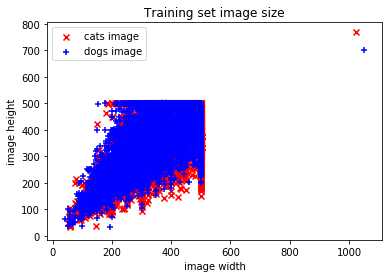

In [2]:
import matplotlib.pyplot as plt

plt.scatter(cats_images_size[:,1], cats_images_size[:,0], marker = 'x', color = 'r', label='cats image')
plt.scatter(dogs_images_size[:,1], dogs_images_size[:,0], marker = '+', color = 'b', label='dogs image')
plt.title('Training set image size')
plt.legend()
plt.xlabel('image width')
plt.ylabel('image height')

plt.show()

从图像尺寸分布图像可以看出，绝大部分图像的尺寸都在500×500内。猫和狗的图片各自都只有一张图像的尺寸偏离正常范围内。于是，我们首先找出这两幅图像。

In [3]:
cat_max_size_id = np.argmax(cats_images_size, axis=0)[0]
dog_max_size_id = np.argmax(dogs_images_size, axis=0)[0]

print(cat_max_size_id)
print(dog_max_size_id)
print(cats_images_size[cat_max_size_id])
print(dogs_images_size[dog_max_size_id])

835
2317
[ 768. 1023.]
[ 702. 1050.]


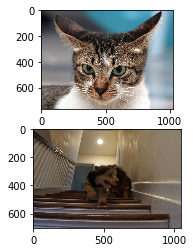

In [4]:
cat_dir = os.path.join(train_dir, 'cat.{}.jpg'.format(cat_max_size_id))
dog_dir = os.path.join(train_dir, 'dog.{}.jpg'.format(dog_max_size_id))

cat_img = cv2.imread(cat_dir)
cat_img = cv2.cvtColor(cat_img, cv2.COLOR_BGR2RGB)
dog_img = cv2.imread(dog_dir)
dog_img = cv2.cvtColor(dog_img, cv2.COLOR_BGR2RGB)

plt.subplot(2,1,1)
plt.imshow(cat_img)

plt.subplot(2,1,2)
plt.imshow(dog_img)

但是，我们的图像在输入模型训练时候，是需要进行数据预处理的，例如我们可能对图像进行尺寸缩放或裁剪。图像裁剪可能会影响模型的训练，因为它可能将图像的有用信息抛弃。而在这个项目中，我将只使用尺寸缩放。缩放后的猫狗图像如下图所示，我们还是可以很确定的辨认出猫和狗，这说明了图像缩放这种预处理方式并不会对模型分类带来很坏的影响，并不影响其学习，所以我认为这对异常值也没有必要处理！

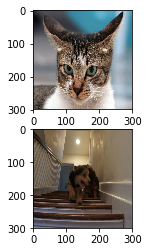

In [5]:
cat_img = cv2.resize(cat_img, (299, 299))
dog_img = cv2.resize(dog_img, (299, 299))

plt.subplot(2,1,1)
plt.imshow(cat_img)

plt.subplot(2,1,2)
plt.imshow(dog_img)

### 分析异常值
既然图像的尺寸对模型的训练不会带来影响或者影响甚微，那么便接着探索是否存在其他异常值。由于读取图像时三个通道的值都限制在[0,255]内，分布范围较小，因此图像通道值的最大值和最小值不会成为异常值。而均值也不太可能成为异常值，原因同上。因而，我将目光投向通道值的标准差，原因是通过标准差更可能发现异常值。设想一下，假如一幅图像中通道值的标准差很小，这意味着图像越接近于纯色，则其包含的信息量越少，越不容易用于提取可用于分类的特征。为了将问题简化，将图像读取为灰度图，这样就只需要分析单通道了。

In [6]:
cats_images_std = np.zeros(shape=(12500, ))
dogs_images_std = np.zeros(shape=(12500, ))

for i in range(len(cats_images_size)):
    cat_image_dir = os.path.join(train_dir, 'cat.{}.jpg'.format(i))
    dog_image_dir = os.path.join(train_dir, 'dog.{}.jpg'.format(i))
    
    cat_img_std = np.std(cv2.imread(cat_image_dir,cv2.IMREAD_GRAYSCALE))
    dog_img_std = np.std(cv2.imread(dog_image_dir,cv2.IMREAD_GRAYSCALE))
    
    cats_images_std[i] = cat_img_std
    dogs_images_std[i] = dog_img_std

In [7]:
cat_max_std_id = np.argmin(cats_images_std)
dog_max_std_id = np.argmin(dogs_images_std)

print(cat_max_std_id)
print(dog_max_std_id)

8784
7878


下面两幅图像分别是所有猫狗图像中，灰度图模型下，通道值标准差最小的情况。可以看到，虽然图像颜色比较单一，但是我们还是能够通过人眼清晰地识别出猫和狗，因此这部分不存在异常值。

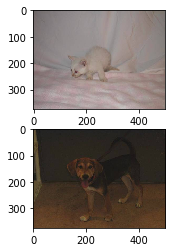

In [8]:
cat_dir = os.path.join(train_dir, 'cat.{}.jpg'.format(cat_max_std_id))
dog_dir = os.path.join(train_dir, 'dog.{}.jpg'.format(dog_max_std_id))

cat_img = cv2.imread(cat_dir)
cat_img = cv2.cvtColor(cat_img, cv2.COLOR_BGR2RGB)
dog_img = cv2.imread(dog_dir)
dog_img = cv2.cvtColor(dog_img, cv2.COLOR_BGR2RGB)

plt.subplot(2,1,1)
plt.imshow(cat_img)

plt.subplot(2,1,2)
plt.imshow(dog_img)

### 类别标签标注异常值探索
训练数据的异常值还有另一种情况，那就是类别标签标注上的异常值。最直接但同时也是最繁琐的方法，就是耐心地将训练集里面的图片都手动检查一遍！但事实上我们可以用其他方式解决，那就是使用预处理模型来进行排查，这将大大减少我们的工作量。基本思路是，使用表现最佳的预处理模型（这里选择在Imagenet上表现较优的Xception）对训练集的图片进行预测，给出预测正确分类概率最高的n个分类。检验猫、狗标签是否在这n个类别之内，若不在则将图像视为可能的异常值。    
第一步当然是找出Imagenet中各种猫和狗的标签：

In [1]:
dog_labels = ['n02085620','n02085782','n02085936','n02086079','n02086240','n02086646','n02086910','n02087046',
              'n02087394','n02088094','n02088238','n02088364','n02088466','n02088632','n02089078','n02089867',
              'n02089973','n02090379','n02090622','n02090721','n02091032','n02091134','n02091244','n02091467',
              'n02091635','n02091831','n02092002','n02092339','n02093256','n02093428','n02093647','n02093754',
              'n02093859','n02093991','n02094114','n02094258','n02094433','n02095314','n02095570','n02095889',
              'n02096051','n02096177','n02096294','n02096437','n02096585','n02097047','n02097130','n02097209',
              'n02097298','n02097474','n02097658','n02098105','n02098286','n02098413','n02099267','n02099429',
              'n02099601','n02099712','n02099849','n02100236','n02100583','n02100735','n02100877','n02101006',
              'n02101388','n02101556','n02102040','n02102177','n02102318','n02102480','n02102973','n02104029',
              'n02104365','n02105056','n02105162','n02105251','n02105412','n02105505','n02105641','n02105855',
              'n02106030','n02106166','n02106382','n02106550','n02106662','n02107142','n02107312','n02107574',
              'n02107683','n02107908','n02108000','n02108089','n02108422','n02108551','n02108915','n02109047',
              'n02109525','n02109961','n02110063','n02110185','n02110341','n02110627','n02110806','n02110958',
              'n02111129','n02111277','n02111500','n02111889','n02112018','n02112137','n02112350','n02112706',
              'n02113023','n02113186','n02113624','n02113712','n02113799','n02113978']

cat_labels = ['n02123045','n02123159','n02123394','n02123597','n02124075','n02125311','n02127052']

In [2]:
from keras.applications.xception import Xception
from keras.preprocessing import image
from keras.applications.xception import preprocess_input, decode_predictions
import numpy as np

model = Xception(weights='imagenet')

Using TensorFlow backend.


这一步使用Xception模型对训练集中的猫狗图像进行预测，并将预测结果分别保存在 cats_preds 和 dogs_preds 中。

In [3]:
import os

train_dir = "/home/leechan/Documents/Capstone_Dog vs. Cats/Project_Dogs_vs_Cats/Dataset_Dogs_vs_Cats/train"

cats_preds = np.zeros(shape=(12500, 1000))
dogs_preds = np.zeros(shape=(12500, 1000))

for i in range(len(cats_preds)):
    cat_image_path = os.path.join(train_dir, 'cat.{}.jpg'.format(i))
    cat_img = image.load_img(cat_image_path, target_size=(299,299))
    cat_x = image.img_to_array(cat_img)
    cat_x = np.expand_dims(cat_x, axis=0)
    cat_x = preprocess_input(cat_x)
    
    dog_image_path = os.path.join(train_dir, 'dog.{}.jpg'.format(i))
    dog_img = image.load_img(dog_image_path, target_size=(299,299))
    dog_x = image.img_to_array(dog_img)
    dog_x = np.expand_dims(dog_x, axis=0)
    dog_x = preprocess_input(dog_x)
    
    cat_pred = model.predict(cat_x)
    dog_pred = model.predict(dog_x)
    
    cats_preds[i] = cat_pred
    dogs_preds[i] = dog_pred

使用 decode_predictions ，设置top参数为n（一开始均为30），将预测结果转化为预测正确分类概率最高的n个分类。

In [4]:
cats_preds_decode = decode_predictions(cats_preds, top=30)
dogs_preds_decode = decode_predictions(dogs_preds, top=30)

cat_pred_l= np.array(cats_preds_decode)
dog_pred_l= np.array(dogs_preds_decode)

检验猫、狗标签是否在这n个类别之内，若不在则将图像视为可能的异常值。将这些可能的异常值存储在 cat_abnormal 和 dog_abnormal 中。

In [5]:
cat_abnormal = np.ones(shape=(12500,1))
dog_abnormal = np.ones(shape=(12500,1))

i = 0
for pred in cat_pred_l:
    pred_labels = pred[:,0]
    for cat_label in cat_labels:
        if cat_label in pred_labels:
            cat_abnormal[i] = 0
            break
    i+=1
    
j = 0
for pred in dog_pred_l:
    pred_labels = pred[:,0]
    for dog_label in dog_labels:
        if dog_label in pred_labels:
            dog_abnormal[j] = 0
            break
    j+=1

打印训练集中猫狗图片的可能异常值数量。

In [7]:
print(int(sum(cat_abnormal)[0]))
print(int(sum(dog_abnormal)[0]))

80
23


显示训练集的可能异常值。

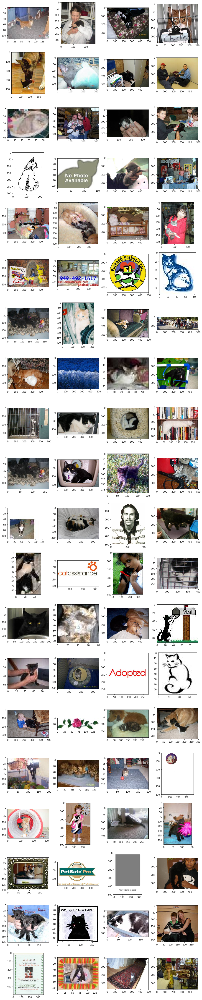

In [9]:
import cv2
import matplotlib.pyplot as plt

cat_abnormal_id = np.nonzero(cat_abnormal)[0]
dog_abnormal_id = np.nonzero(dog_abnormal)[0]

fig = plt.figure()
fig.set_figheight(80)
fig.set_figwidth(15)

i = 1
j = 1

for cat_id in cat_abnormal_id:
    img_path = os.path.join(train_dir, 'cat.{}.jpg'.format(cat_id))
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    y = fig.add_subplot(np.ceil(sum(cat_abnormal)/4),4,i)
    y.imshow(img)
    i+=1

plt.show()

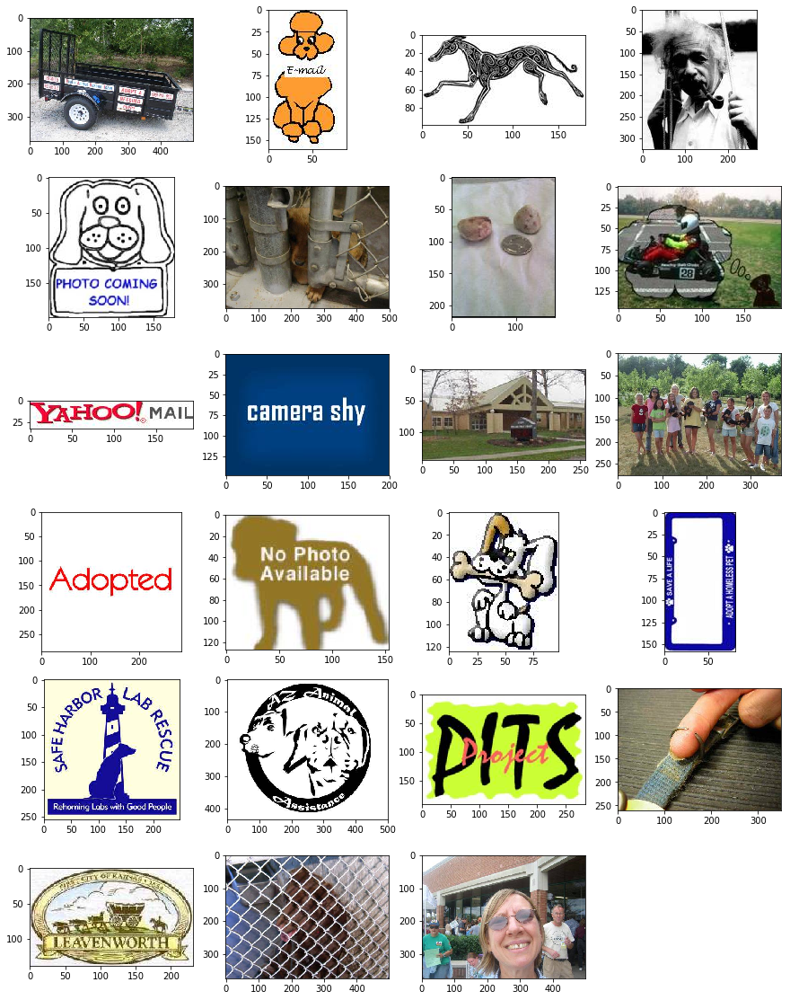

In [10]:
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(15)

i = 1
j = 1

for dog_id in dog_abnormal_id:
    img_path = os.path.join(train_dir, 'dog.{}.jpg'.format(dog_id))
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    y = fig.add_subplot(np.ceil(sum(dog_abnormal)/4),4,i)
    y.imshow(img)
    i+=1

plt.show()

可以看到，当top参数均设置为30时，猫图片的异常值统计数量较多，而失误也多。而对于狗图片的异常值统计情况，则几乎没有失误。这可能是由于imagenet在构建数据集时对狗的归类做的比较详细（imagenet上狗的类别有118种，而猫的类别只有7种）。因此，我认为设置top参数时，应该将猫和狗分开讨论，而不能一概而论。经过一番尝试，我将猫的top参数设置为35，狗的top参数设置为10，最后获得的可能的异常值如下面两幅图所示，其中猫有62幅，狗有36。相较于完全手动检查一遍，这已经大大降低了工作量。

In [11]:
cats_preds_decode = decode_predictions(cats_preds, top=35)
dogs_preds_decode = decode_predictions(dogs_preds, top=10)

cat_pred_l= np.array(cats_preds_decode)
dog_pred_l= np.array(dogs_preds_decode)

cat_abnormal = np.ones(shape=(12500,1))
dog_abnormal = np.ones(shape=(12500,1))

i = 0
for pred in cat_pred_l:
    pred_labels = pred[:,0]
    for cat_label in cat_labels:
        if cat_label in pred_labels:
            cat_abnormal[i] = 0
            break
    i+=1
    
j = 0
for pred in dog_pred_l:
    pred_labels = pred[:,0]
    for dog_label in dog_labels:
        if dog_label in pred_labels:
            dog_abnormal[j] = 0
            break
    j+=1
    
print(int(sum(cat_abnormal)[0]))
print(int(sum(dog_abnormal)[0]))

cat_abnormal_id = np.nonzero(cat_abnormal)[0]
dog_abnormal_id = np.nonzero(dog_abnormal)[0]


62
36


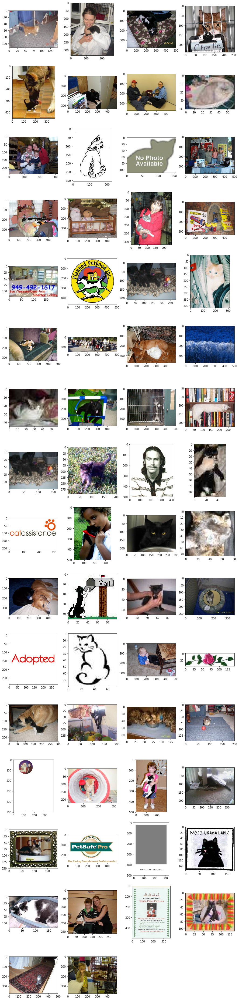

In [12]:
fig = plt.figure()
fig.set_figheight(68)
fig.set_figwidth(15)

i = 1
j = 1
for cat_id in cat_abnormal_id:
    img_path = os.path.join(train_dir, 'cat.{}.jpg'.format(cat_id))
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    y = fig.add_subplot(np.ceil(sum(cat_abnormal)/4),4,i)
    y.imshow(img)
    i+=1

plt.show()

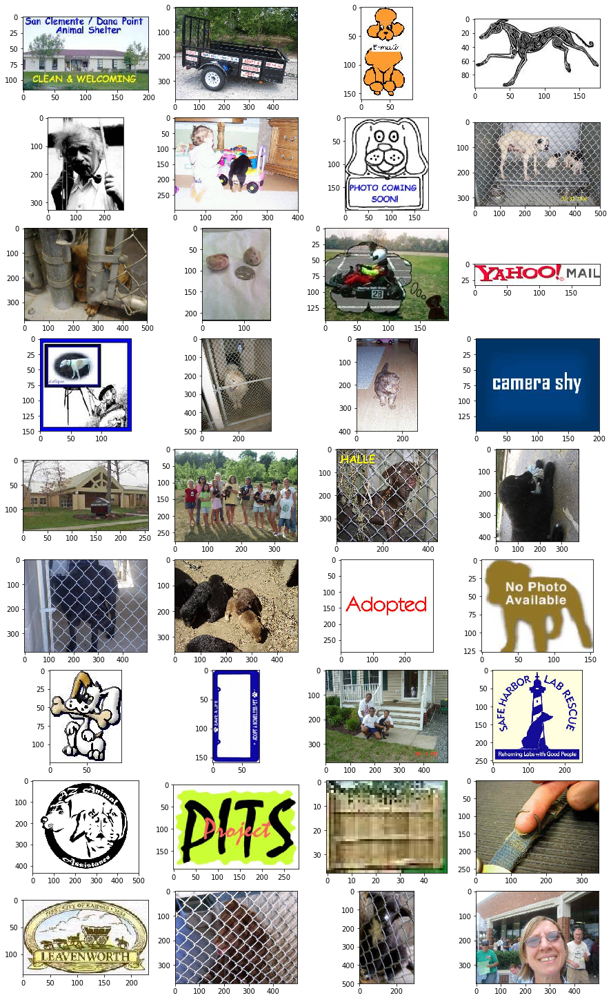

In [13]:
fig = plt.figure()
fig.set_figheight(26)
fig.set_figwidth(15)

i = 1
j = 1
for dog_id in dog_abnormal_id:
    img_path = os.path.join(train_dir, 'dog.{}.jpg'.format(dog_id))
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    y = fig.add_subplot(np.ceil(sum(dog_abnormal)/4),4,i)
    y.imshow(img)
    i+=1

plt.show()

### 结论
从上面的分析可以看到，猫狗大战数据集的异常值主要是标注上的异常值。在将训练数据输入模型训练之前，需要将这些数据进行预处理。我的处理方式将是：  
1. 将主题完全无关的图片删除
2. 对于分类错误的图片，修改类别标注（例如本来是狗的图片却标注为猫，这时候就需要将标准修改）
3. 将背景复杂的图片进行裁剪
这些异常值很难通过数据科学的方法（均值、平均值等）进行描述和发现，在处理的时候也选择手动处理。在报告的第三部分“方法”中将介绍具体的处理过程。